In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")
import seaborn as sns
sns.set_style("darkgrid")

%config InlineBackend.figure_format ="svg"

In [3]:
cars = pd.read_csv("../Data/car_prices.csv", on_bad_lines='skip')

In [7]:
cars.head()

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg566472,ca,5.0,16639.0,white,black,"kia motors america, inc",20500,21500,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
1,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg561319,ca,5.0,9393.0,white,beige,"kia motors america, inc",20800,21500,Tue Dec 16 2014 12:30:00 GMT-0800 (PST)
2,2014,BMW,3 Series,328i SULEV,Sedan,automatic,wba3c1c51ek116351,ca,4.5,1331.0,gray,black,financial services remarketing (lease),31900,30000,Thu Jan 15 2015 04:30:00 GMT-0800 (PST)
3,2015,Volvo,S60,T5,Sedan,automatic,yv1612tb4f1310987,ca,4.1,14282.0,white,black,volvo na rep/world omni,27500,27750,Thu Jan 29 2015 04:30:00 GMT-0800 (PST)
4,2014,BMW,6 Series Gran Coupe,650i,Sedan,automatic,wba6b2c57ed129731,ca,4.3,2641.0,gray,black,financial services remarketing (lease),66000,67000,Thu Dec 18 2014 12:30:00 GMT-0800 (PST)


# Car Price Analysis

* Read in the dataset `car_prices.csv` using the code below.
* Run the info and describe DataFrame methods to get a quick understanding of the data.

In [12]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 558811 entries, 0 to 558810
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   year          558811 non-null  int64  
 1   make          548510 non-null  object 
 2   model         548412 non-null  object 
 3   trim          548160 non-null  object 
 4   body          545616 non-null  object 
 5   transmission  493458 non-null  object 
 6   vin           558811 non-null  object 
 7   state         558811 non-null  object 
 8   condition     547017 non-null  float64
 9   odometer      558717 non-null  float64
 10  color         558062 non-null  object 
 11  interior      558062 non-null  object 
 12  seller        558811 non-null  object 
 13  mmr           558811 non-null  int64  
 14  sellingprice  558811 non-null  int64  
 15  saledate      558811 non-null  object 
dtypes: float64(2), int64(3), object(11)
memory usage: 68.2+ MB


In [14]:
cars.describe()

,year,condition,odometer,mmr,sellingprice
count,558811.000000,547017.000000,558717.000000,558811.000000,558811.000000
mean,2010.038696,3.424512,68323.195797,13769.324646,13611.262461
std,3.966812,0.949439,53397.752933,9679.874607,9749.656919
min,1982.000000,1.000000,1.000000,25.000000,1.000000
25%,2007.000000,2.700000,28374.000000,7100.000000,6900.000000
50%,2012.000000,3.600000,52256.000000,12250.000000,12100.000000
75%,2013.000000,4.200000,99112.000000,18300.000000,18200.000000
max,2015.000000,5.000000,999999.000000,182000.000000,230000.000000


In [16]:
for col in cars.columns:
  print(cars[col].value_counts(), end = "\n" + "*" * 50 + "\n")

year
2012    102315
2013     98168
2014     81070
2011     48548
2008     31502
2007     30845
2006     26913
2010     26485
2005     21394
2009     20594
2004     17342
2003     13281
2002      9715
2015      9411
2001      6468
2000      5227
1999      3363
1998      2149
1997      1546
1996       851
1995       711
1994       392
1993       205
1992       132
1991        67
1990        49
1989        20
1986        11
1988        11
1985        10
1987         8
1984         5
1982         2
1983         1
Name: count, dtype: int64
**************************************************
make
Ford          93554
Chevrolet     60197
Nissan        53946
Toyota        39871
Dodge         30710
              ...  
airstream         1
ford tk           1
chev truck        1
hyundai tk        1
Lotus             1
Name: count, Length: 96, dtype: int64
**************************************************
model
Altima        19349
F-150         14479
Fusion        12946
Camry         12545
Escape  

In [9]:
categorical_list = ["make" , "model" , "trim" ,"transmission" ,"state","color", "interior" ,"body"]
categorical_dtypes = ["category"] * len(categorical_list)
categorical_dtypes

['category',
 'category',
 'category',
 'category',
 'category',
 'category',
 'category',
 'category']

In [11]:
categorical_columns = dict(zip(categorical_list , categorical_dtypes))
categorical_columns

{'make': 'category',
 'model': 'category',
 'trim': 'category',
 'transmission': 'category',
 'state': 'category',
 'color': 'category',
 'interior': 'category',
 'body': 'category'}

In [13]:
cars = cars.astype(categorical_columns)
cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 558811 entries, 0 to 558810
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   year          558811 non-null  int64   
 1   make          548510 non-null  category
 2   model         548412 non-null  category
 3   trim          548160 non-null  category
 4   body          545616 non-null  category
 5   transmission  493458 non-null  category
 6   vin           558811 non-null  object  
 7   state         558811 non-null  category
 8   condition     547017 non-null  float64 
 9   odometer      558717 non-null  float64 
 10  color         558062 non-null  category
 11  interior      558062 non-null  category
 12  seller        558811 non-null  object  
 13  mmr           558811 non-null  int64   
 14  sellingprice  558811 non-null  int64   
 15  saledate      558811 non-null  object  
dtypes: category(8), float64(2), int64(3), object(3)
memory usage: 39.6+ MB


In [15]:
 (
    pd.to_datetime(cars["saledate"], errors="coerce", utc=True)
        .dt.tz_localize(None)      # remove timezone
        .dt.normalize()            # remove hours
)

C:\Users\ahmad\AppData\Local\Temp\ipykernel_7420\2596842740.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(cars["saledate"], errors="coerce", utc=True)


0        2014-12-16
1        2014-12-16
2        2015-01-14
3        2015-01-28
4        2014-12-18
            ...    
558806   2015-07-09
558807   2015-07-08
558808   2015-07-08
558809   2015-07-08
558810   2015-05-27
Name: saledate, Length: 558811, dtype: datetime64[ns]

In [17]:
cars["saledate"] = (
    pd.to_datetime(cars["saledate"] ,
    errors="coerce",
    utc = True
    ).
    dt.tz_localize(None). # remove timezone
    dt.normalize() # remove hours
)
cars.saledate

C:\Users\ahmad\AppData\Local\Temp\ipykernel_7420\1879655600.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  pd.to_datetime(cars["saledate"] ,


0        2014-12-16
1        2014-12-16
2        2015-01-14
3        2015-01-28
4        2014-12-18
            ...    
558806   2015-07-09
558807   2015-07-08
558808   2015-07-08
558809   2015-07-08
558810   2015-05-27
Name: saledate, Length: 558811, dtype: datetime64[ns]

In [19]:
cars.info(memory_usage="deep")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 558811 entries, 0 to 558810
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   year          558811 non-null  int64         
 1   make          548510 non-null  category      
 2   model         548412 non-null  category      
 3   trim          548160 non-null  category      
 4   body          545616 non-null  category      
 5   transmission  493458 non-null  category      
 6   vin           558811 non-null  object        
 7   state         558811 non-null  category      
 8   condition     547017 non-null  float64       
 9   odometer      558717 non-null  float64       
 10  color         558062 non-null  category      
 11  interior      558062 non-null  category      
 12  seller        558811 non-null  object        
 13  mmr           558811 non-null  int64         
 14  sellingprice  558811 non-null  int64         
 15  saledate      558

In [21]:
cars.describe()

,year,condition,odometer,mmr,sellingprice,saledate
count,558811.000000,547017.000000,558717.000000,558811.000000,558811.000000,558811
mean,2010.038696,3.424512,68323.195797,13769.324646,13611.262461,2015-03-05 08:06:35.141828352
min,1982.000000,1.000000,1.000000,25.000000,1.000000,2014-01-01 00:00:00
25%,2007.000000,2.700000,28374.000000,7100.000000,6900.000000,2015-01-20 00:00:00
50%,2012.000000,3.600000,52256.000000,12250.000000,12100.000000,2015-02-12 00:00:00
75%,2013.000000,4.200000,99112.000000,18300.000000,18200.000000,2015-05-21 00:00:00
max,2015.000000,5.000000,999999.000000,182000.000000,230000.000000,2015-07-20 00:00:00
std,3.966812,0.949439,53397.752933,9679.874607,9749.656919,NaN


In [23]:
cars.select_dtypes(include="number").describe().iloc[1: , ]

,year,condition,odometer,mmr,sellingprice
mean,2010.038696,3.424512,68323.195797,13769.324646,13611.262461
std,3.966812,0.949439,53397.752933,9679.874607,9749.656919
min,1982.000000,1.000000,1.000000,25.000000,1.000000
25%,2007.000000,2.700000,28374.000000,7100.000000,6900.000000
50%,2012.000000,3.600000,52256.000000,12250.000000,12100.000000
75%,2013.000000,4.200000,99112.000000,18300.000000,18200.000000
max,2015.000000,5.000000,999999.000000,182000.000000,230000.000000


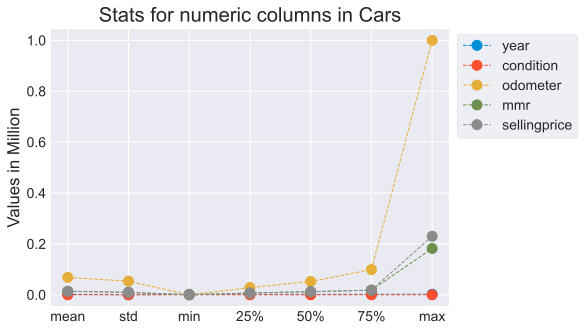

In [25]:
cars.select_dtypes(include="number").div(10**6).describe().iloc[1: , ].plot(marker = "o" ,
                                                                            ms = 10 ,
                                                                            ls = "--",
                                                                            lw = 1 ,
                                                                            title = "Stats for numeric columns in Cars",
                                                                            legend = True)
plt.legend(bbox_to_anchor = (1,1))
plt.ylabel("Values in Million")
plt.show()

In [27]:
cars.select_dtypes("datetime").describe().iloc[1: , ].T

,mean,min,25%,50%,75%,max
saledate,2015-03-05 08:06:35.141828352,2014-01-01,2015-01-20,2015-02-12,2015-05-21,2015-07-20


In [29]:
cars.select_dtypes("object").describe().iloc[1: , ].T

,unique,top,freq
vin,550296,wbanv13588cz57827,5
seller,14264,nissan-infiniti lt,19693


# Numeric Variable Relationships

Use a pairplot to get a good sense for the relationships between the numeric variables in the dataset.

Turn off the upper corner of the pairplot matrix.

* Why do you think the relationship between `sellingprice` and `mmr` (the recommended selling price) is so strong?
* What is the relationship between `sellingprice` and `year` (the year the car was manufactured). Does this make sense?
* Once you've looked at the two relationships above, filter your dataframe down to the `body` styles ['SUV', 'Sedan', 'Convertible', and 'Coupe']. Color the scatterplot based on values in the `body` column. 

In [31]:
len(cars)

558811

In [39]:
sns.pairplot(cars.sample(2500),
             corner = True)
sns.despine()

C:\Users\ahmad\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


* Why do you think the relationship between sellingprice and mmr (the recommended selling price) is so strong?

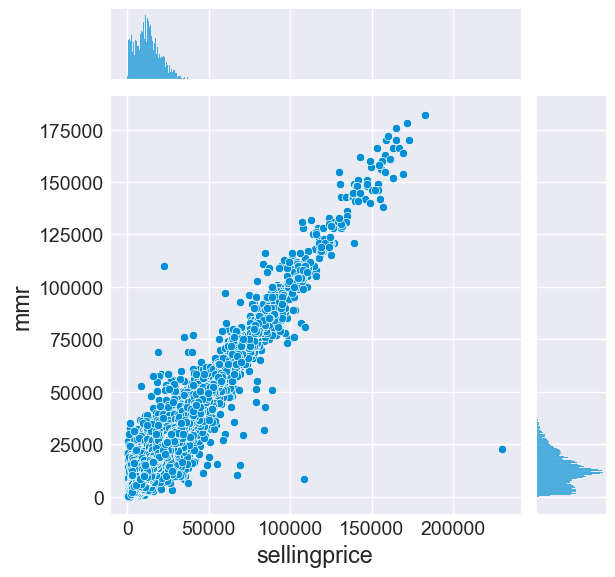

In [41]:
sns.jointplot(data = cars , x ="sellingprice" , y = "mmr" )
sns.despine()

* What is the relationship between `sellingprice` and `year` (the year the car was manufactured). Does this make sense?

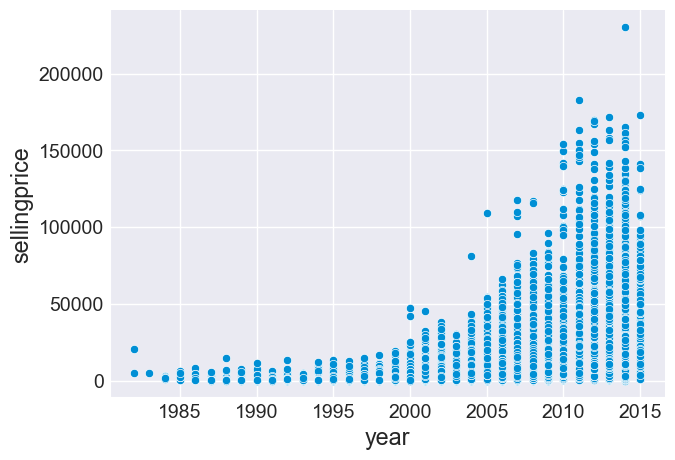

In [43]:
sns.scatterplot(data = cars , x = "year" , y = "sellingprice")
sns.despine()

* Once you've looked at the two relationships above, filter your dataframe down to the `body` styles ['SUV', 'Sedan', 'Convertible', and 'Coupe']. Color the scatterplot based on values in the `body` column. 

In [83]:
cars.body = cars.body.astype("object")

In [85]:
style_list = ["SUV", "Sedan", "Convertible", "Coupe"]

In [87]:
cars.loc[(cars.body.isin(style_list))]

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg566472,ca,5.0,16639.0,white,black,"kia motors america, inc",20500,21500,2014-12-16
1,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg561319,ca,5.0,9393.0,white,beige,"kia motors america, inc",20800,21500,2014-12-16
2,2014,BMW,3 Series,328i SULEV,Sedan,automatic,wba3c1c51ek116351,ca,4.5,1331.0,gray,black,financial services remarketing (lease),31900,30000,2015-01-14
3,2015,Volvo,S60,T5,Sedan,automatic,yv1612tb4f1310987,ca,4.1,14282.0,white,black,volvo na rep/world omni,27500,27750,2015-01-28
4,2014,BMW,6 Series Gran Coupe,650i,Sedan,automatic,wba6b2c57ed129731,ca,4.3,2641.0,gray,black,financial services remarketing (lease),66000,67000,2014-12-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
558803,2012,Hyundai,Elantra,Limited,Sedan,NaN,5npdh4ae7ch106397,pa,4.0,66720.0,gray,gray,champion mazda,10250,10400,2015-07-08
558804,2012,Nissan,Sentra,2.0 SR,Sedan,NaN,3n1ab6ap3cl622485,tn,2.6,35858.0,white,gray,nissan-infiniti lt,9950,10400,2015-07-08
558805,2011,BMW,5 Series,528i,Sedan,automatic,wbafr1c53bc744672,fl,3.9,66403.0,white,brown,lauderdale imports ltd bmw pembrok pines,20300,22800,2015-07-06
558806,2015,Kia,K900,Luxury,Sedan,NaN,knalw4d4xf6019304,in,4.5,18255.0,silver,black,avis corporation,35300,33000,2015-07-09


In [89]:
filtered_cars = cars.query("body in @style_list")
filtered_cars

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate
0,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg566472,ca,5.0,16639.0,white,black,"kia motors america, inc",20500,21500,2014-12-16
1,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg561319,ca,5.0,9393.0,white,beige,"kia motors america, inc",20800,21500,2014-12-16
2,2014,BMW,3 Series,328i SULEV,Sedan,automatic,wba3c1c51ek116351,ca,4.5,1331.0,gray,black,financial services remarketing (lease),31900,30000,2015-01-14
3,2015,Volvo,S60,T5,Sedan,automatic,yv1612tb4f1310987,ca,4.1,14282.0,white,black,volvo na rep/world omni,27500,27750,2015-01-28
4,2014,BMW,6 Series Gran Coupe,650i,Sedan,automatic,wba6b2c57ed129731,ca,4.3,2641.0,gray,black,financial services remarketing (lease),66000,67000,2014-12-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
558803,2012,Hyundai,Elantra,Limited,Sedan,NaN,5npdh4ae7ch106397,pa,4.0,66720.0,gray,gray,champion mazda,10250,10400,2015-07-08
558804,2012,Nissan,Sentra,2.0 SR,Sedan,NaN,3n1ab6ap3cl622485,tn,2.6,35858.0,white,gray,nissan-infiniti lt,9950,10400,2015-07-08
558805,2011,BMW,5 Series,528i,Sedan,automatic,wbafr1c53bc744672,fl,3.9,66403.0,white,brown,lauderdale imports ltd bmw pembrok pines,20300,22800,2015-07-06
558806,2015,Kia,K900,Luxury,Sedan,NaN,knalw4d4xf6019304,in,4.5,18255.0,silver,black,avis corporation,35300,33000,2015-07-09


In [91]:
filtered_cars.body.value_counts().nlargest(4).index.to_list()

['Sedan', 'SUV', 'Coupe', 'Convertible']

In [93]:
cars.loc[(cars.body.isin(style_list))]["body"].value_counts()

body
Sedan          199437
SUV            119292
Coupe           14602
Convertible      8652
Name: count, dtype: int64

In [95]:
cars.body

0               SUV
1               SUV
2             Sedan
3             Sedan
4             Sedan
            ...    
558806        Sedan
558807     Crew Cab
558808          SUV
558809        sedan
558810    SuperCrew
Name: body, Length: 558811, dtype: object

In [97]:
sns.pairplot(data = cars.loc[(cars.body.isin(style_list))].sample(2000), 
             hue = "body" , 
             corner = True ,
             diag_kind = "kde")
sns.despine()

C:\Users\ahmad\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


In [99]:
cars.body = cars.body.astype("category")

#### Correlation Heat Map

* Plot a heatmap of the correlation between the numeric variables. Does it make sense year and condition and odomoter are negatively correlated?


In [72]:
cars.corr(numeric_only = True)

,year,condition,odometer,mmr,sellingprice
year,1.000000,0.551282,-0.772720,0.596623,0.586488
condition,0.551282,1.000000,-0.538874,0.485050,0.538788
odometer,-0.772720,-0.538874,1.000000,-0.588107,-0.582405
mmr,0.596623,0.485050,-0.588107,1.000000,0.983634
sellingprice,0.586488,0.538788,-0.582405,0.983634,1.000000


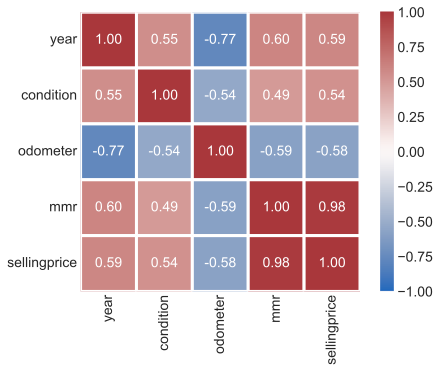

In [74]:
sns.heatmap(cars.corr(numeric_only = True) ,
            vmin = -1 , 
            vmax = +1 , 
            square = True , 
            cmap = "vlag",
            linecolor= "white",
            linewidth = 3,
            annot = True,
            fmt = ".2f")
plt.show()

#### Value Retention

* Filter your data down to the following values of `make` (brand): ['Ford', 'BMW', 'Toyota', 'Chevy'] 

* Build a linear relationship plot comparing `odometer` (distance car has travelled) vs. `sellingprice`, broken out by `make`.

* If you want to fit a regression with scipy.stats, use dropna() on the dataframe first.

In [101]:
cars.make = cars.make.astype("object")

In [109]:
brand_list = ['Ford', 'BMW', 'Toyota', 'Chevrolet']

C:\Users\ahmad\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


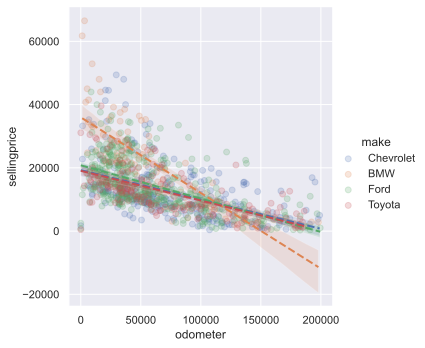

In [149]:
sns.set(rc = {"figure.figsize" :(12,6)})
sns.lmplot(data = cars.loc[(cars.make.isin(brand_list)) & (cars.sellingprice < 150000) & (cars.odometer < 200000)].sample(1000), 
           x = "odometer" ,
           y = "sellingprice",
           hue = "make",
           scatter_kws = {"alpha":0.2},
           line_kws={"lw":2 , "ls":"--"}
            )
sns.despine()

In [73]:
import scipy.stats as stats

cars_regress = cars.dropna()

stats.linregress(x=cars_regress["odometer"], y=cars_regress["sellingprice"])

LinregressResult(slope=-0.10686305954841509, intercept=20818.284085956468, rvalue=-0.57738498191986, pvalue=0.0, stderr=0.00021987650761310995, intercept_stderr=18.587962282863682)

In [123]:
linrear_regression_components = dict()
for brand in brand_list:
    cars_model_regress = cars.loc[(cars.make == brand)].dropna()
    linrear_regression_components[brand] = (stats.linregress(x=cars_model_regress["odometer"] , y = cars_model_regress["sellingprice"])[0],
                                            stats.linregress(x=cars_model_regress["odometer"],  y = cars_model_regress["sellingprice"])[1])

linrear_regression_components

{'Ford': (-0.09953734771818878, 20840.011075886516),
 'BMW': (-0.22250330429676327, 35567.979744684795),
 'Toyota': (-0.07594777614361672, 17813.017107685304),
 'Chevrolet': (-0.08841045962774956, 18705.58735748506)}

# Categorical Variable Relationships

* Bin the `condition` variable into increments of .5. For example, the first bin will be '1-1.5', the second '1.5-2', and so on up until the maximum condition value of 5. Use pd.cut() to create the bins.

* Build a barplot of the average price by condition bin.

In [151]:
bins = np.linspace(1, 5, 9)
labels = ["1-1.5", "1.5-2", "2-2.5", "2.5-3", "3-3.5", "3.5-4", "4-4.5", "4.5-5"]

In [153]:
cars["condition_bins"] = pd.cut(cars.condition , bins = bins , labels = labels)

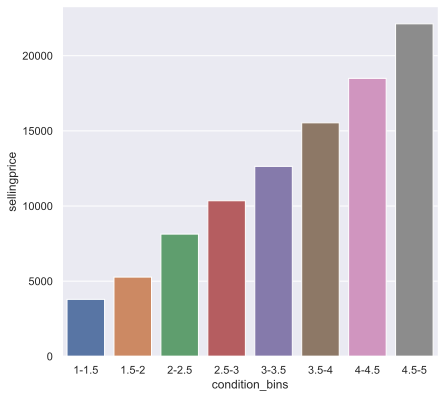

In [155]:
fig, ax = plt.subplots(figsize=(6,6))
sns.barplot(data = cars , 
            x = "condition_bins" ,
            y = "sellingprice" ,
            errorbar = None
)
sns.despine()

# Price by make and condition

* Create a pivot table with the top 10 most common car brands `make` column as rows, and condition bins as columns. The values in the table should be the average selling price for each make/condition combination. Consider using value_counts to get the top 10 most common brands.

* Once you've created the table, build a heatmap from the data. Which brands and quality levels have the highest selling prices? Does this match your expecations?

In [132]:
cars.make.value_counts().nlargest(10)

make
Ford         93554
Chevrolet    60197
Nissan       53946
Toyota       39871
Dodge        30710
Honda        27206
Hyundai      21816
BMW          20719
Kia          18077
Chrysler     17276
Name: count, dtype: int64

In [157]:
top10_brand_cars = cars.make.value_counts().nlargest(10).index.to_list()
top10_brand_cars

['Ford',
 'Chevrolet',
 'Nissan',
 'Toyota',
 'Dodge',
 'Honda',
 'Hyundai',
 'BMW',
 'Kia',
 'Chrysler']

In [159]:
cars[cars["make"].isin(top10_brand_cars)]

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate,condition_bins
0,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg566472,ca,5.0,16639.0,white,black,"kia motors america, inc",20500,21500,2014-12-16,4.5-5
1,2015,Kia,Sorento,LX,SUV,automatic,5xyktca69fg561319,ca,5.0,9393.0,white,beige,"kia motors america, inc",20800,21500,2014-12-16,4.5-5
2,2014,BMW,3 Series,328i SULEV,Sedan,automatic,wba3c1c51ek116351,ca,4.5,1331.0,gray,black,financial services remarketing (lease),31900,30000,2015-01-14,4-4.5
4,2014,BMW,6 Series Gran Coupe,650i,Sedan,automatic,wba6b2c57ed129731,ca,4.3,2641.0,gray,black,financial services remarketing (lease),66000,67000,2014-12-18,4-4.5
5,2015,Nissan,Altima,2.5 S,Sedan,automatic,1n4al3ap1fn326013,ca,1.0,5554.0,gray,black,enterprise vehicle exchange / tra / rental / t...,15350,10900,2014-12-30,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
558805,2011,BMW,5 Series,528i,Sedan,automatic,wbafr1c53bc744672,fl,3.9,66403.0,white,brown,lauderdale imports ltd bmw pembrok pines,20300,22800,2015-07-06,3.5-4
558806,2015,Kia,K900,Luxury,Sedan,NaN,knalw4d4xf6019304,in,4.5,18255.0,silver,black,avis corporation,35300,33000,2015-07-09,4-4.5
558808,2012,BMW,X5,xDrive35d,SUV,automatic,5uxzw0c58cl668465,ca,4.8,50561.0,black,black,financial services remarketing (lease),29800,34000,2015-07-08,4.5-5
558809,2015,Nissan,Altima,2.5 S,sedan,automatic,1n4al3ap0fc216050,ga,3.8,16658.0,white,black,enterprise vehicle exchange / tra / rental / t...,15100,11100,2015-07-08,3.5-4


In [161]:
cars_pivot = pd.pivot_table(data = cars[cars["make"].isin(top10_brand_cars)] , 
                            index = "make" , 
                            columns= "condition_bins" , 
                            values = {"sellingprice":"mean"})
cars_pivot

sellingprice                                           \
condition_bins        1-1.5        1.5-2         2-2.5         2.5-3   
make                                                                   
BMW             4326.923077  6848.680865  10478.320029  12795.277669   
Chevrolet       3021.031746  5384.030601   7425.967945  10325.668781   
Chrysler        2354.545455  4301.224656   5367.031437   9077.602013   
Dodge           4094.907407  5299.306603   7127.988641   9840.543230   
Ford            4175.866667  5282.734146   8550.886379  10954.656807   
Honda           5418.181818  5013.392857   7924.010577   9179.641598   
Hyundai         3089.285714  5124.115218   7283.134792   8600.312323   
Kia             4710.000000  4208.728571   6639.857005   8147.949483   
Nissan          4592.682927  5509.596553   8431.096744  10016.940794   
Toyota          5304.545455  5876.940329   8438.789013   9851.481564   

                                                                        
condition_bins         3-3.5         3.5-4         4-4.5         4.5-5  
make                                                                    
BMW             16397.610281  21911.286118  28791.890310  35902.992693  
Chevrolet       11622.675195  14436.514288  16733.687841  21580.124553  
Chrysler         9247.621069  14813.315207  15212.500990  18388.446281  
Dodge           10517.710952  14051.693213  14893.500000  18400.000000  
Ford            13394.647490  15374.553012  17820.920366  20810.886556  
Honda           11618.430007  13724.741442  16415.864917  19317.726330  
Hyundai         10312.067568  11704.661821  13483.934264  16502.773497  
Kia             10236.522039  11998.424662  13986.038947  16246.605411  
Nissan          11893.454024  13056.597333  14654.276116  16105.622175  
Toyota          12023.032821  14271.166362  16420.315016  19970.274684

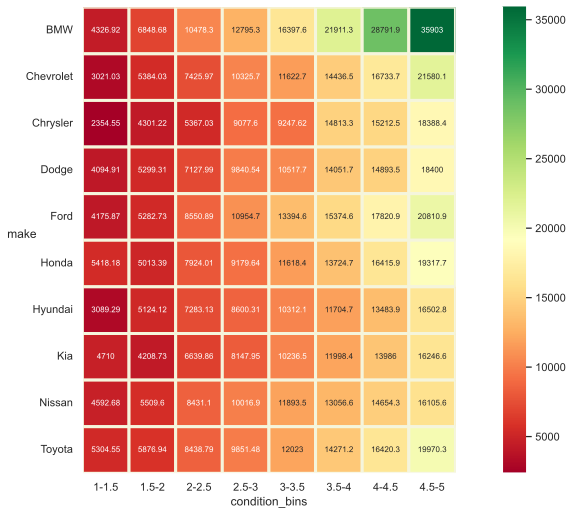

In [163]:
sns.set(rc = {"figure.figsize" : (15,8)})
sns.heatmap(cars_pivot.droplevel(level = 0 , axis = 1) , 
            vmin = cars_pivot.min().min() , 
            vmax = cars_pivot.max().max() , 
            annot = True , 
            fmt = "g",
            annot_kws={"size":8},
            cmap = "RdYlGn",
            square=True,
            linecolor = "beige",
            linewidths = 3           
           )
plt.ylabel("make", rotation = 0)
plt.yticks(rotation = 0)
sns.despine()

# Ford F-150 Deep Dive

Our client is mostly interested in purchasing work trucks - specifically the Ford F-150, the highest selling automobile for decades in the US. 

* Filter your data down to rows where `model` is "F-150".
* Then build a histogram of sellingprice with 10 bins. 

In [166]:
f150 = cars.loc[cars.model == "F-150"]
f150

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate,condition_bins
983,2012,Ford,F-150,XLT,SuperCrew,NaN,1ftew1cm9ckd05952,ca,4.6,51189.0,gray,gray,"ford motor credit company,llc pd",19700,20200,2014-12-18,4.5-5
1013,2012,Ford,F-150,FX2,SuperCrew,automatic,1ftfw1ct0cfb64807,ca,4.6,28687.0,gray,black,"ford motor credit company,llc pd",26700,30500,2014-12-18,4.5-5
1052,2012,Ford,F-150,XLT,SuperCrew,automatic,1ftfw1et3ckd61619,ca,3.9,27465.0,black,gray,"ford motor credit company,llc pd",26300,28800,2014-12-18,3.5-4
1054,2012,Ford,F-150,XLT,SuperCrew,automatic,1ftfw1ef9cfc79834,ca,3.5,93858.0,white,gray,aaero sweet company,18900,19500,2014-12-17,3-3.5
1074,2012,Ford,F-150,Lariat,SuperCab,automatic,1ftfx1ef6cfc80260,ca,4.1,46444.0,red,black,"ford motor credit company,llc pd",26300,25600,2014-12-18,4-4.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
558561,2010,Ford,F-150,SVT Raptor,supercab,automatic,1ftex1ev0afa23790,pa,4.3,57388.0,orange,black,r hollenshead auto sales inc,34400,34250,2015-06-18,4-4.5
558574,2008,Ford,F-150,FX4,supercrew,automatic,1ftpw14v98fa62904,nv,3.8,79088.0,white,beige,unique autos,17500,18700,2015-06-18,3.5-4
558589,2007,Ford,F-150,XLT,supercab,automatic,1ftpx12v07fa11502,fl,3.0,85534.0,red,gray,onemain rem/orange county motorsports llc,9875,10400,2015-06-18,2.5-3
558621,2001,Ford,F-150,Lariat,supercab,automatic,2ftrx18wx1ca18663,nv,2.7,86500.0,green,gray,premier motors inc,3625,6150,2015-06-18,2.5-3


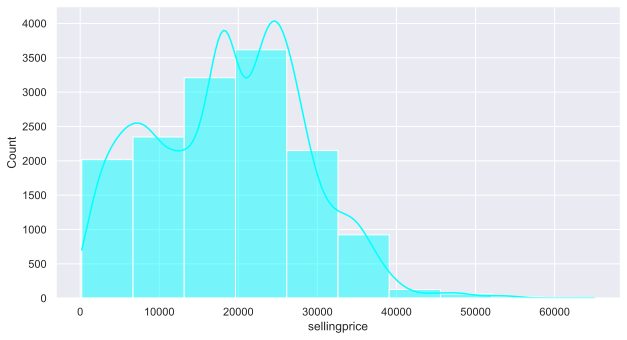

In [168]:
sns.set(rc = {"figure.figsize":(9,5)})
sns.histplot(data = f150 , 
             x = "sellingprice" , 
             bins = 10 , 
             color ="cyan",
             kde = True)
sns.despine()

* Build a barplot of `sellingprice` by `trim` for the F150s.

In [171]:
f150.trim.value_counts().nlargest(16)

trim
XLT                 6637
XL                  2251
Lariat              2012
FX4                 1545
STX                  535
Platinum             487
King Ranch           310
FX2                  229
SVT Raptor           221
Harley-Davidson      101
Limited               70
60th Anniversary      26
Lariat Limited        23
SVT Lightning         19
Base                   9
Work                   4
Name: count, dtype: int64

In [173]:
f150.trim = f150.trim.astype("object")

C:\Users\ahmad\AppData\Local\Temp\ipykernel_7420\980880436.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f150.trim = f150.trim.astype("object")


In [175]:
f150.sort_values(by = ["sellingprice"] , ascending=False)

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate,condition_bins
473510,2014,Ford,F-150,SVT Raptor,supercrew,automatic,1ftfw1r65efc14766,ga,4.9,10867.0,red,black,mall of georgia mazda,55300,65000,2015-05-26,4.5-5
146891,2013,Ford,F-150,SVT Raptor,SuperCrew,automatic,1ftfw1r68dfb21349,ca,2.4,21020.0,red,black,mckenna audi/mckenna bmw,47900,64000,2015-01-14,2-2.5
464109,2014,Ford,F-150,SVT Raptor,supercrew,automatic,1ftfw1r64efc88695,fl,5.0,1291.0,red,black,ritter & associates inc,56800,60500,2015-05-25,4.5-5
215397,2014,Ford,F-150,SVT Raptor,SuperCrew,NaN,1ftfw1r65efb98505,tx,4.9,7105.0,black,black,tdaf remarketing,53600,56600,2015-01-27,4.5-5
467750,2014,Ford,F-150,SVT Raptor,supercrew,NaN,1ftfw1r69efb04237,pa,5.0,6894.0,red,black,tdaf remarketing,56100,55800,2015-05-28,4.5-5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205548,2000,Ford,F-150,XLT,Extended Cab,automatic,1ftrx17w4ynb26931,oh,1.0,137267.0,black,gray,new horizons credit union,2625,300,2015-02-11,NaN
403152,2003,Ford,F-150,XL,Regular Cab,NaN,2ftrf17283ca05415,ma,2.0,1.0,silver,gray,imperial ford corporation,3800,250,2015-03-09,1.5-2
205741,1995,Ford,F-150,XL,Regular Cab,automatic,1ftef15y5sna11137,md,1.0,1.0,green,tan,darcars of fairfax,1500,225,2015-02-09,NaN
409935,1993,Ford,F-150,XL,Regular Cab,automatic,2ftdf15y0pcb40606,ms,1.0,999999.0,blue,blue,republic finance llc/pearl,350,200,2015-04-22,NaN


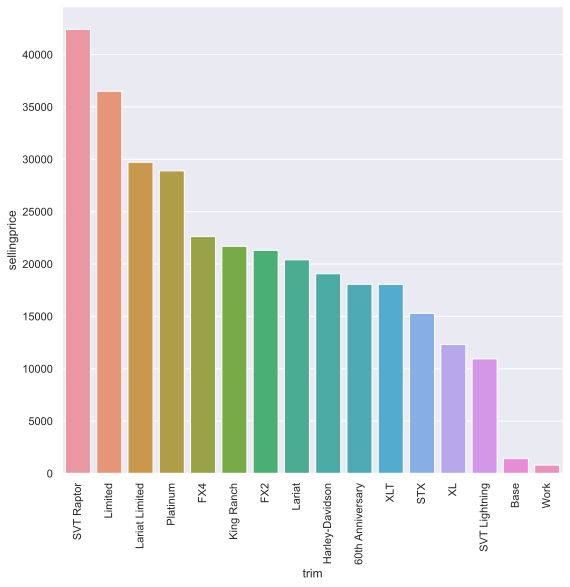

In [179]:
sns.set(rc={"figure.figsize": (8,8)})

order = (
    f150
    .groupby("trim")["sellingprice"]
    .mean()
    .sort_values(ascending=False)
    .index
)

sns.barplot(
    data=f150,
    x="trim",
    y="sellingprice",
    errorbar=None,
    order=order
)

plt.xticks(rotation=90)
sns.despine()

* Filter the dataset down to the trim levels ["XL", "XLT", "Platinum", "SVT Raptor"].

* Then, build a jointplot of `condition` (not binned) by `sellingprice`.

In [182]:
f150.trim = f150.trim.astype("object")

C:\Users\ahmad\AppData\Local\Temp\ipykernel_7420\980880436.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f150.trim = f150.trim.astype("object")


In [184]:
trim_list = ['XL', 'XLT', 'Platinum', 'SVT Raptor']

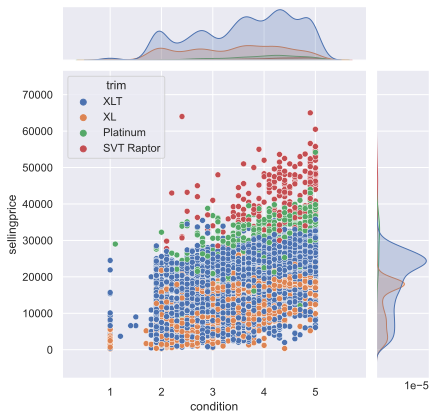

In [186]:
sns.jointplot(data = f150.query("trim in @trim_list") , 
              x = "condition" , 
              y = "sellingprice" , 
              kind ="scatter" , 
              hue ="trim")
sns.despine()

### Are there any "Deals"?

Ok, thanks to the charts above we're getting closer to honing in on the trucks to purchase.

* Create a column `diff_to_mmr` which is the difference between `sellingprice` and `mmr`.
* Then build a barplot looking at mean `diff_to_mmr` by `color`.
* Which color sells for more than the recommended price?

In [188]:
f150["diff_to_mmr"] = f150["sellingprice"] - f150["mmr"]

C:\Users\ahmad\AppData\Local\Temp\ipykernel_7420\4018470813.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  f150["diff_to_mmr"] = f150["sellingprice"] - f150["mmr"]


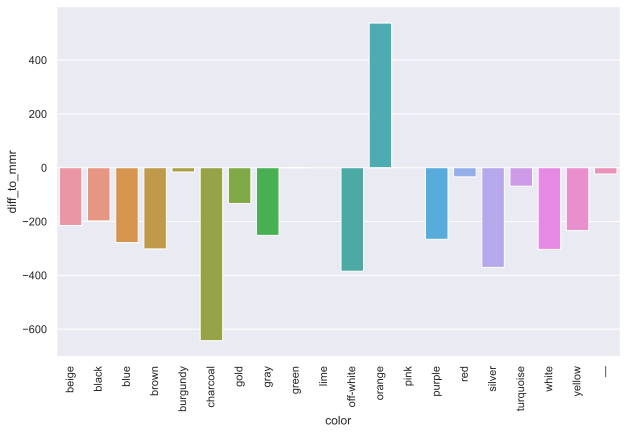

In [191]:
sns.set(rc = {"figure.figsize": (9,6)})
sns.barplot(data = f150 , x = "color" , y = "diff_to_mmr" , errorbar=None)
plt.xticks(rotation = 90)
sns.despine()

* Further filter the data to the trims below. Exclude the color 'orange' and look only at trucks from years between 2009 and 2014. 

In [194]:
f150.columns

Index(['year', 'make', 'model', 'trim', 'body', 'transmission', 'vin', 'state',
       'condition', 'odometer', 'color', 'interior', 'seller', 'mmr',
       'sellingprice', 'saledate', 'condition_bins', 'diff_to_mmr'],
      dtype='object')

In [196]:
trim_list = ['XL', 'XLT', 'Platinum', 'SVT Raptor']

In [198]:
f150_reduced = f150.query("(color != 'orange') & (trim in @trim_list) & (year >= 2009)  & (year<= 2014)")
f150_reduced.head()

,year,make,model,trim,body,transmission,vin,state,condition,odometer,color,interior,seller,mmr,sellingprice,saledate,condition_bins,diff_to_mmr
983,2012,Ford,F-150,XLT,SuperCrew,NaN,1ftew1cm9ckd05952,ca,4.6,51189.0,gray,gray,"ford motor credit company,llc pd",19700,20200,2014-12-18,4.5-5,500
1052,2012,Ford,F-150,XLT,SuperCrew,automatic,1ftfw1et3ckd61619,ca,3.9,27465.0,black,gray,"ford motor credit company,llc pd",26300,28800,2014-12-18,3.5-4,2500
1054,2012,Ford,F-150,XLT,SuperCrew,automatic,1ftfw1ef9cfc79834,ca,3.5,93858.0,white,gray,aaero sweet company,18900,19500,2014-12-17,3-3.5,600
1095,2012,Ford,F-150,XL,Regular Cab,NaN,1ftmf1cm6ckd43568,ca,3.5,51851.0,white,gray,aaero sweet company,11950,12800,2014-12-18,3-3.5,850
2001,2011,Ford,F-150,XL,SuperCab,automatic,1ftex1em5bfc39949,ca,3.6,91626.0,white,gray,"enterprise fleet management exchange, inc.",14800,13300,2014-12-26,3.5-4,-1500


In [200]:
f150_pivot = pd.pivot_table(data = f150_reduced , 
                            index = "trim" , 
                            columns = "condition_bins" ,
                            values = {"sellingprice":"mean"})
f150_pivot

sellingprice                                            \
condition_bins        1-1.5         1.5-2         2-2.5         2.5-3   
trim                                                                    
Platinum            29000.0  25570.000000  25294.117647  23875.555556   
SVT Raptor              NaN           NaN  37583.333333  36392.857143   
XL                      NaN   8006.250000  12007.770270  12852.358974   
XLT                     NaN  15420.614035  16820.263158  18762.219828   

                                                                        
condition_bins         3-3.5         3.5-4         4-4.5         4.5-5  
trim                                                                    
Platinum        26917.796610  26883.152174  29517.808219  33677.631579  
SVT Raptor      36546.666667  40131.428571  42566.949153  45947.619048  
XL              15388.942308  16119.674556  17494.629156  18528.623188  
XLT             20110.634328  21281.357759  23204.475831  25061.060065

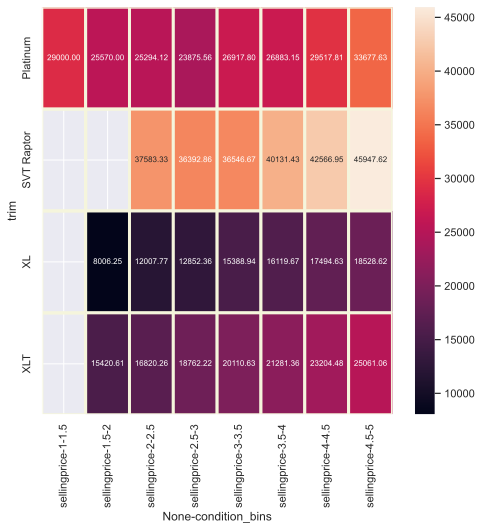

In [202]:
sns.set(rc = {"figure.figsize" : (7,7)})
sns.heatmap(f150_pivot , 
            vmin = f150_pivot.min().min() , 
            vmax = f150_pivot.max().max() , 
            annot_kws = {"size":8},
            #cmap = "RdYlGn",
            linecolor = "beige",
            linewidth = 3,
            annot = True , 
            fmt = ".2f" , 
            #square =  True
           )

sns.despine()

### Best state to buy trucks in?

* Ok, we've decided on the XLT model, it has more features than XL but is still quite affordable. Also filter out any trucks with a quality of less than 3.5. Your DataFrame should only have trucks with a quality of 3.5 or greater.
* Build a subplot with a bar chart of `state` by `diff_to_mmr` and `state` by `count` to find which states sell XLT models below mmr and have ample quantity.

In [205]:
f150.columns

Index(['year', 'make', 'model', 'trim', 'body', 'transmission', 'vin', 'state',
       'condition', 'odometer', 'color', 'interior', 'seller', 'mmr',
       'sellingprice', 'saledate', 'condition_bins', 'diff_to_mmr'],
      dtype='object')

In [207]:
f150_XLT = (f150_reduced
            .query("trim == 'XLT' and condition >= 3.5")
            .groupby(["state"])
            .agg(
                mean_diff = ("diff_to_mmr" , "mean") ,
                auto_count = ("diff_to_mmr" , "mean")
            )
           )
f150_XLT.head()

,mean_diff,auto_count
state,,
ab,-3344.339623,-3344.339623
al,-5900.000000,-5900.000000
az,-730.000000,-730.000000
ca,857.594937,857.594937
co,493.203883,493.203883


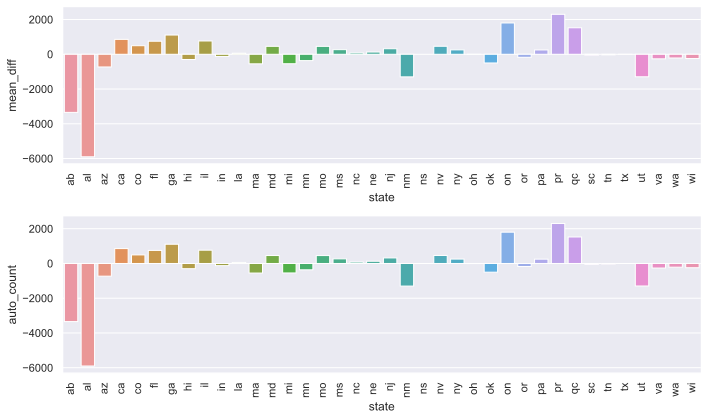

In [209]:
fig , ax  = plt.subplots(ncols=1 ,nrows = 2 , figsize = (10,6))
sns.barplot(data = f150_XLT.reset_index() ,
           x = "state",
           y = "mean_diff",
            errorbar=None, 
            ax = ax[0]
           )
ax[0].tick_params(axis = "x" , rotation = 90)

sns.barplot(data = f150_XLT.reset_index() ,
            x = "state",
            y = "auto_count",
            ax = ax[1]
           )
ax[1].tick_params(axis ="x" , rotation = 90)
plt.tight_layout()
sns.despine()

* Ok, looks like Utah (our client has an office nearby) has a good amount of quantity and a low average price. Take a look at the average diff_to_mmr and count of cars by saledate - feel free to return just a table. 

In [211]:
f150_reduced.columns

Index(['year', 'make', 'model', 'trim', 'body', 'transmission', 'vin', 'state',
       'condition', 'odometer', 'color', 'interior', 'seller', 'mmr',
       'sellingprice', 'saledate', 'condition_bins', 'diff_to_mmr'],
      dtype='object')

In [212]:
f150.query("trim == 'XLT' & state == 'ut' & condition >= 3.5").groupby(["saledate"]).agg({"diff_to_mmr" : ["mean" , "count"]})

diff_to_mmr      
                   mean count
saledate                     
2015-01-07 -2325.000000     2
2015-01-13 -1900.000000     1
2015-01-20  -900.000000     2
2015-02-03 -1400.000000     2
2015-02-10 -1787.500000    12
2015-02-17  -377.777778     9
2015-02-24  -500.000000     6
2015-03-03  -600.000000     5
2015-06-02 -1625.000000     2
2015-06-16 -1957.142857     7